In [1]:
!pip install torchattacks

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.3/49.3 kB 2.0 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.

In [2]:
!pip install evaluate_attacks

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [8]:
import torch
import torch.nn as nn
import torchvision.models as models

# Load the pre-trained AlexNet model
model = models.alexnet(pretrained=True)

# Modify the final layer to match the number of classes in CIFAR-10 (10 classes)
num_classes = 10
model.classifier[6] = nn.Linear(model.classifier[6].in_features, num_classes)

# Freeze the parameters of the early layers
for param in model.parameters():
    param.requires_grad = False

# Save the trained model
model_path = '/content/drive/My Drive/weights/AlexNet/cifar10_AlexNet.pth'
torch.save(model.state_dict(), model_path)
print(f'Model saved to {model_path}')


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Model saved to /content/drive/My Drive/weights/AlexNet/cifar10_AlexNet.pth


In [9]:
# Reinitialize the model (without pre-trained weights)
model = models.alexnet(pretrained=False)

# Modify the final layer to match the number of classes in CIFAR-10 (10 classes)
model.classifier[6] = nn.Linear(model.classifier[6].in_features, 10)

# Load the saved weights
model_path = '/content/drive/My Drive/weights/AlexNet/cifar10_AlexNet.pth'
model.load_state_dict(torch.load(model_path))

# Set the model to evaluation mode
model.eval()
print(f'Model loaded from {model_path}')


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


Model loaded from /content/drive/My Drive/weights/AlexNet/cifar10_AlexNet.pth


In [10]:
# Load pre-trained model
model = models.alexnet(pretrained=False)
model.classifier[6] = nn.Linear(model.classifier[6].in_features, 10)  # Adjust for CIFAR-10

model.load_state_dict(torch.load(model_path))
model.eval()

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)


AlexNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (avgpool): AdaptiveAvgPool2d(output_size=(6, 6))
  (classifier): Sequential(
    (0): Dropout(p=0.5, inplace=False)
    (1): Linear(in_features=9216, out_features=4096, bias=True)
 

Files already downloaded and verified


Success Rate of VNIFGSM attack: 0.08125


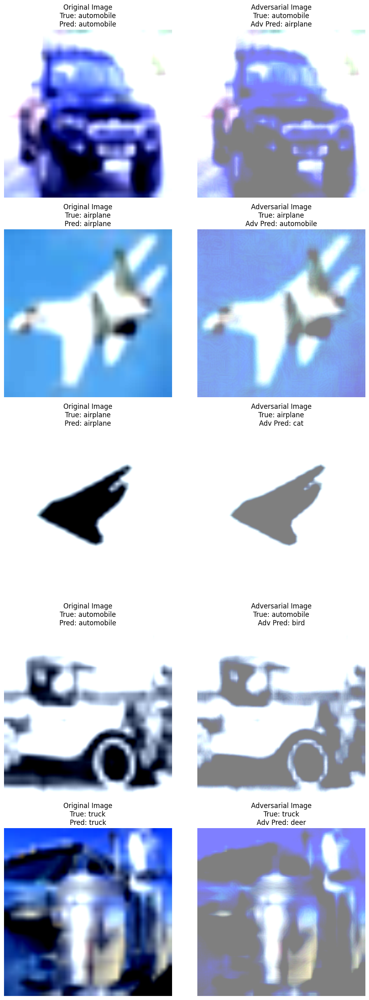

Success Rate of UPGD attack: 0.08125


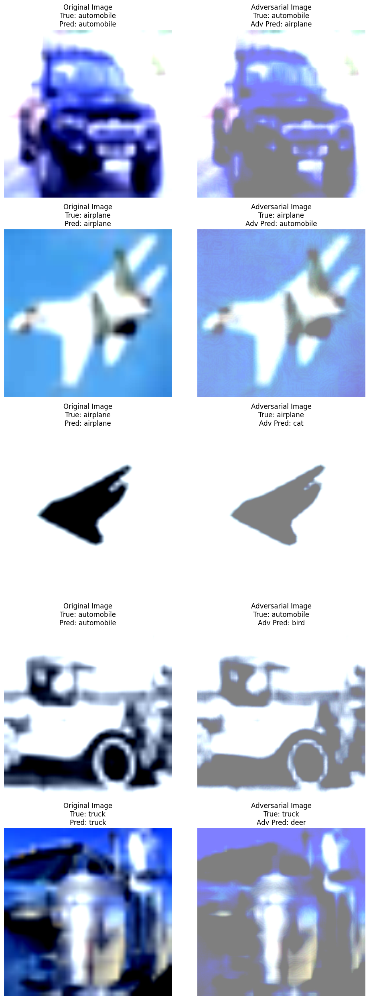

Success Rate of APGDT attack: 0.08125


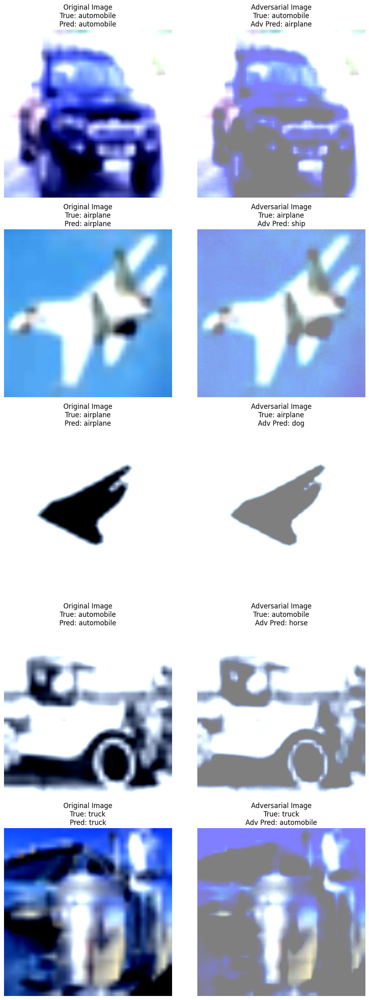

Success Rate of DIFGSM attack: 0.08125


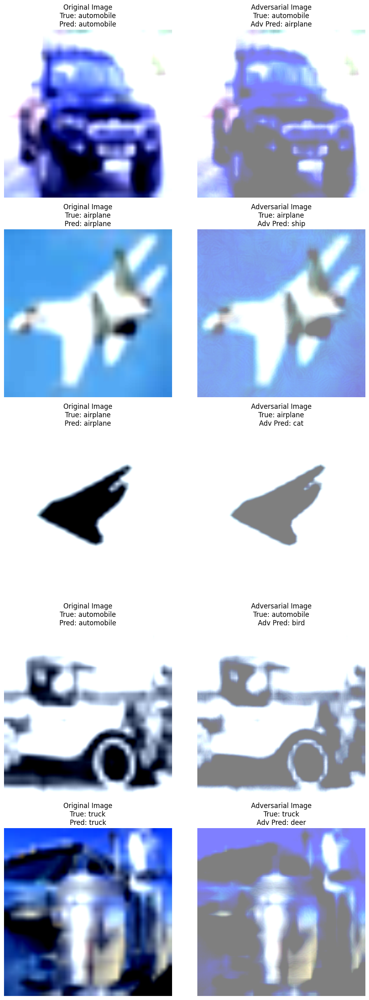

In [12]:
import torchattacks
from evaluate_attacks import attack_eval
import torchvision
from torchvision import transforms
from torch.utils.data import DataLoader

transform = transforms.Compose([
    transforms.Resize(224),  # Resize the images to 224x224 pixels
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])


# Load CIFAR-10 dataset
test_dataset = torchvision.datasets.CIFAR10(root='./data', train=False, download=True, transform=transform)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

# Run attacks
# VNIFGSM
attack_eval(torchattacks.VNIFGSM, model, test_loader, device)

# UPGD
attack_eval(torchattacks.UPGD, model, test_loader, device)

# APGDT
attack_eval(torchattacks.APGDT, model, test_loader, device)

# DIFGSM
attack_eval(torchattacks.DIFGSM, model, test_loader, device)


In [13]:
# FAB
attack_eval(torchattacks.FAB, model, test_loader, device)

Success Rate of FAB attack: 0.0
No successful adversarial attacks were found.


Success Rate of SPSA attack: 0.071875


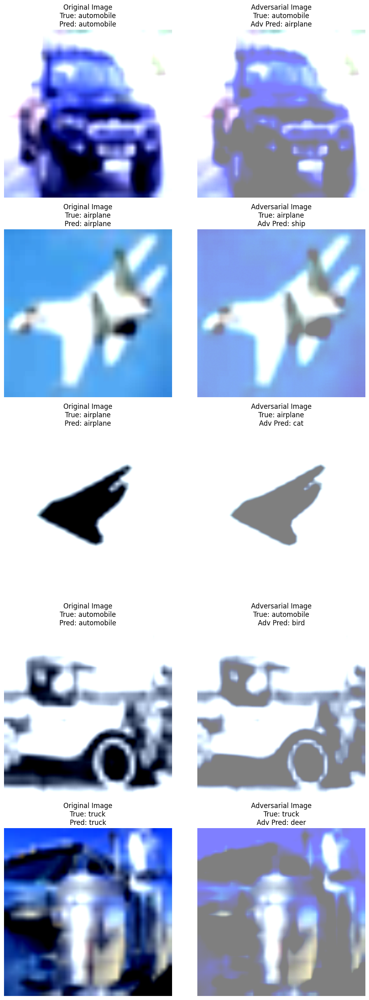

Success Rate of EADL1 attack: 0.08125


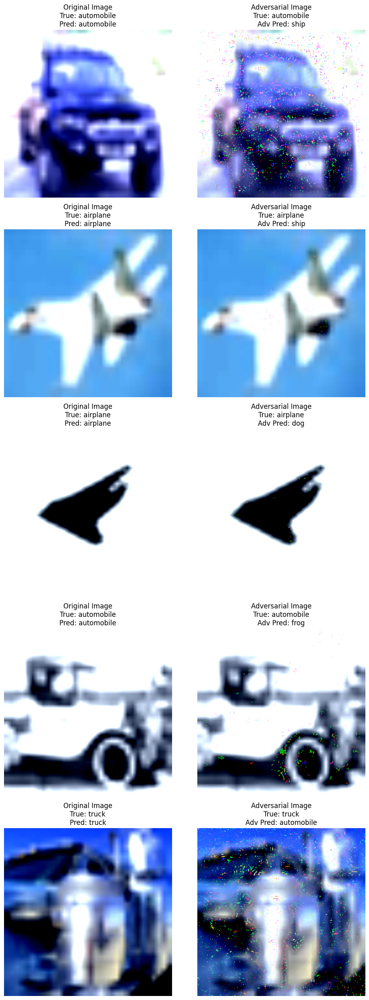

Success Rate of EADEN attack: 0.08125


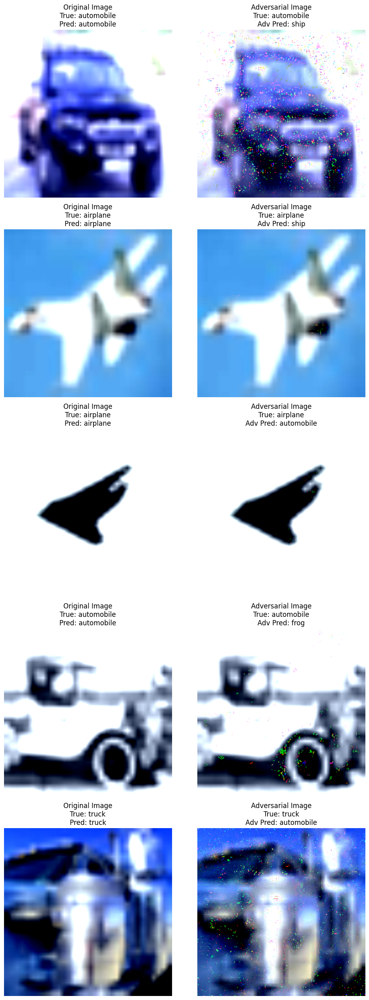

Success Rate of PIFGSM attack: 0.08125


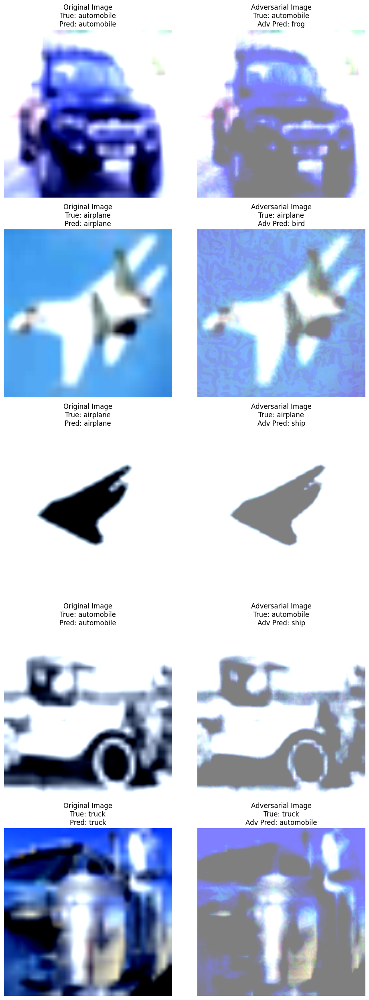

In [18]:
# SPSA
attack_eval(torchattacks.SPSA, model, test_loader, device)

# # JSMA (Jacobian-based Saliency Map Attack)
# attack_eval(torchattacks.JSMA, model, test_loader, device)

# EADL1 (Elastic-Net Attack to DNNs with L1)
attack_eval(torchattacks.EADL1, model, test_loader, device)

# EADEN (Elastic-Net Attack to DNNs with Elastic-Net)
attack_eval(torchattacks.EADEN, model, test_loader, device)

# PIFGSM (Patch Iterative FGSM)
attack_eval(torchattacks.PIFGSM, model, test_loader, device)

# # PIFGSM++
# attack_eval(torchattacks.PIFGSMpp, model, test_loader, device)